In [2]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import os
import time

# mpl.style.use('latte')

df = pd.read_csv('../data_csv/uncleaned_csv/train_img_unclean.csv')
df.nunique()

IDX       465
Name      445
Origin     12
Type        1
Width       1
Height      1
Path      465
dtype: int64

In [2]:
def plt_outliers(start_idx, rows=3, cols=6):
    selected_images = []
    fig_images, ax_images = plt.subplots(rows, cols)
    fig_images.set_size_inches(30, 15)
    current_row = 0
    current_col = 0

    for index in range(start_idx, len(df)):
        img = cv2.cvtColor(cv2.imread(df['Path'].iloc[index]), cv2.COLOR_BGR2RGB)
        histr = cv2.calcHist([img], [0], None, [256], [0, 256])
        max_peak_x = np.argmax(histr)
        if (max_peak_x == 0 and len(np.where(histr > 0)[0]) == 1) or max_peak_x > 215:
            ax_images[current_row][current_col].imshow(img, cmap='gray')
            ax_images[current_row][current_col].set_title(f'Selected Image {index}')
            ax_images[current_row][current_col].axis('on')
            selected_images.append(img)

            current_col += 1
            if current_col >= cols:
                current_col = 0
                current_row += 1

            if current_row >= rows:
                break

    plt.show()


def plt_img(start_idx):
    fig, ax = plt.subplots(8,8)
    fig.set_size_inches(30,30)
    c = 0
    for i in range(0,8):
        for j in range(0,8):
            img = cv2.cvtColor(cv2.imread(df['Path'].iloc[start_idx + c]), cv2.COLOR_BGR2GRAY)
            ax[i][j].imshow(img, cmap='gray')
            ax[i][j].set_title(f'{df["Origin"].iloc[start_idx + c]} {c}')
            c += 1

def plt_rgb(start_idx):
    fig, ax = plt.subplots(8,8)
    fig.set_size_inches(30,30)
    c = 0
    for i in range(0,8):
        for j in range(0,8):
            img = cv2.cvtColor(cv2.imread(df['Path'].iloc[start_idx + c]), cv2.COLOR_BGR2RGB)
            ax[i][j].imshow(img)
            ax[i][j].set_title(f'{df["Origin"].iloc[start_idx + c]} {df["Name"].iloc[start_idx + c]}')
            c += 1

def plt_hist(start_idx):
    fig, ax = plt.subplots(8,8)
    fig.set_size_inches(30,30)
    c = 0
    for i in range(0,8):
        for j in range(0,8):
            img = cv2.cvtColor(cv2.imread(df['Path'].iloc[start_idx + c]), cv2.COLOR_BGR2GRAY)
            histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
            ax[i][j].plot(histr)
            ax[i][j].set_title(f'{df["Origin"].iloc[start_idx + c]} {df["Name"].iloc[start_idx + c]}')
            c += 1

In [3]:
df[250:]

,IDX,Name,Origin,Type,Width,Height,Path
250,250,2050.jpg,ORVS,RGB_Img,1024,1024,../data/uncleaned/train/img/ORVS_2050.jpg
251,251,2052.jpg,ORVS,RGB_Img,1024,1024,../data/uncleaned/train/img/ORVS_2052.jpg
252,252,2053.jpg,ORVS,RGB_Img,1024,1024,../data/uncleaned/train/img/ORVS_2053.jpg
253,253,2060.jpg,ORVS,RGB_Img,1024,1024,../data/uncleaned/train/img/ORVS_2060.jpg
254,254,2061.jpg,ORVS,RGB_Img,1024,1024,../data/uncleaned/train/img/ORVS_2061.jpg
...,...,...,...,...,...,...,...
460,460,96_img.jpg,UoA-DR,RGB_Img,1024,1024,../data/uncleaned/train/img/UoA-DR_96_img.jpg
461,461,97_img.jpg,UoA-DR,RGB_Img,1024,1024,../data/uncleaned/train/img/UoA-DR_97_img.jpg
462,462,98_img.jpg,UoA-DR,RGB_Img,1024,1024,../data/uncleaned/train/img/UoA-DR_98_img.jpg
463,463,99_img.jpg,UoA-DR,RGB_Img,1024,1024,../data/uncleaned/train/img/UoA-DR_99_img.jpg


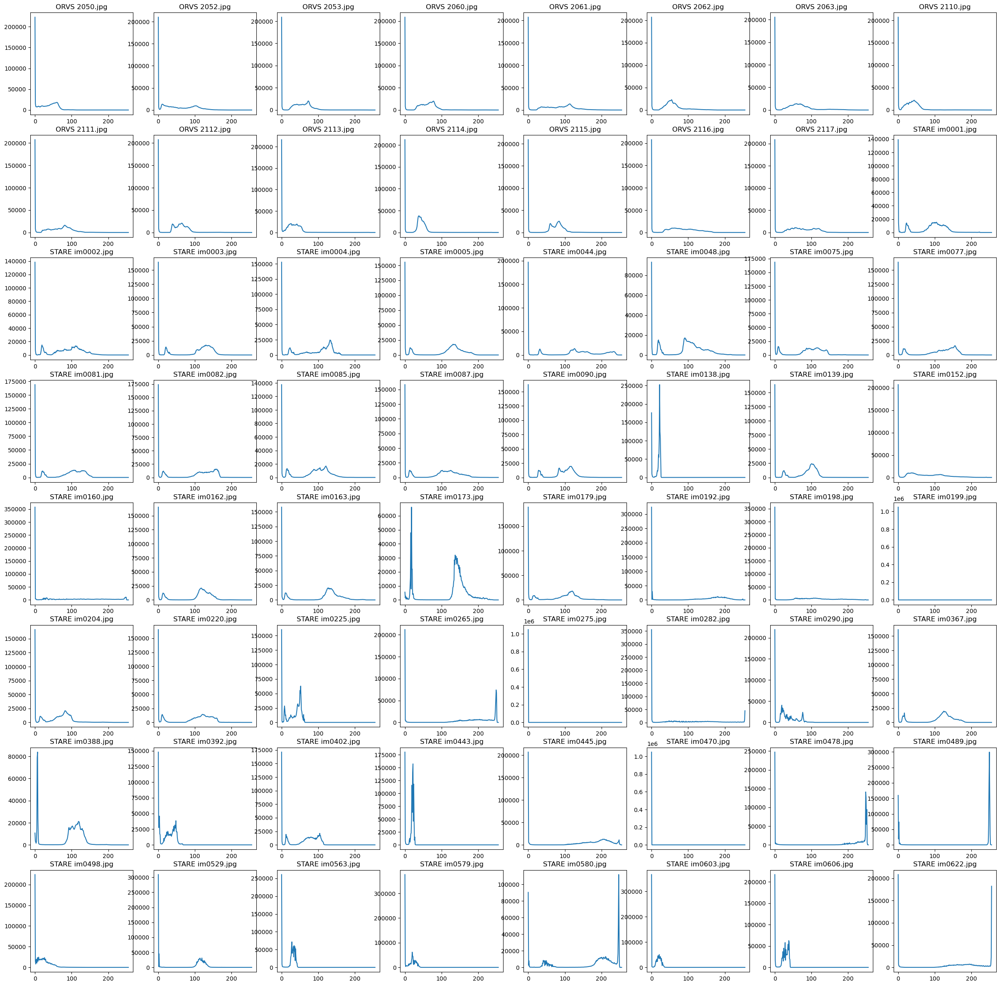

In [4]:
plt_hist(250)

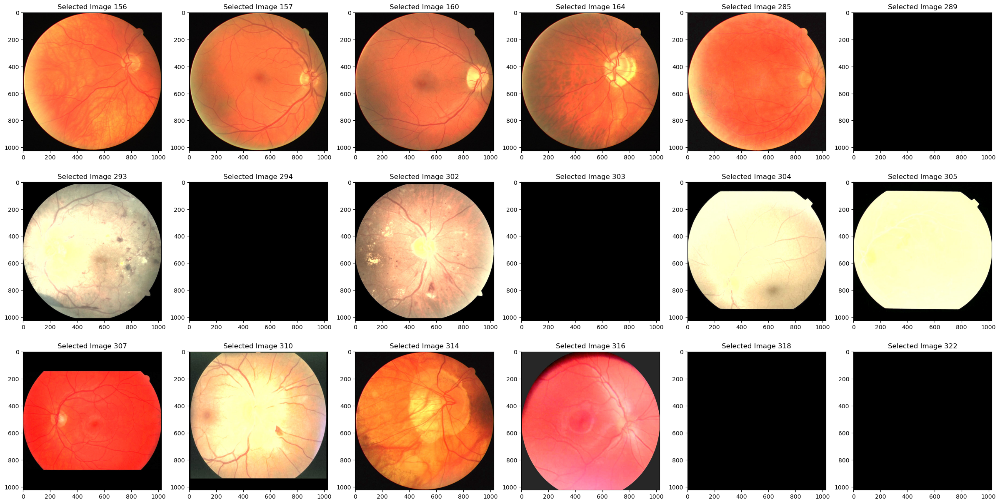

In [5]:
plt_outliers(0)

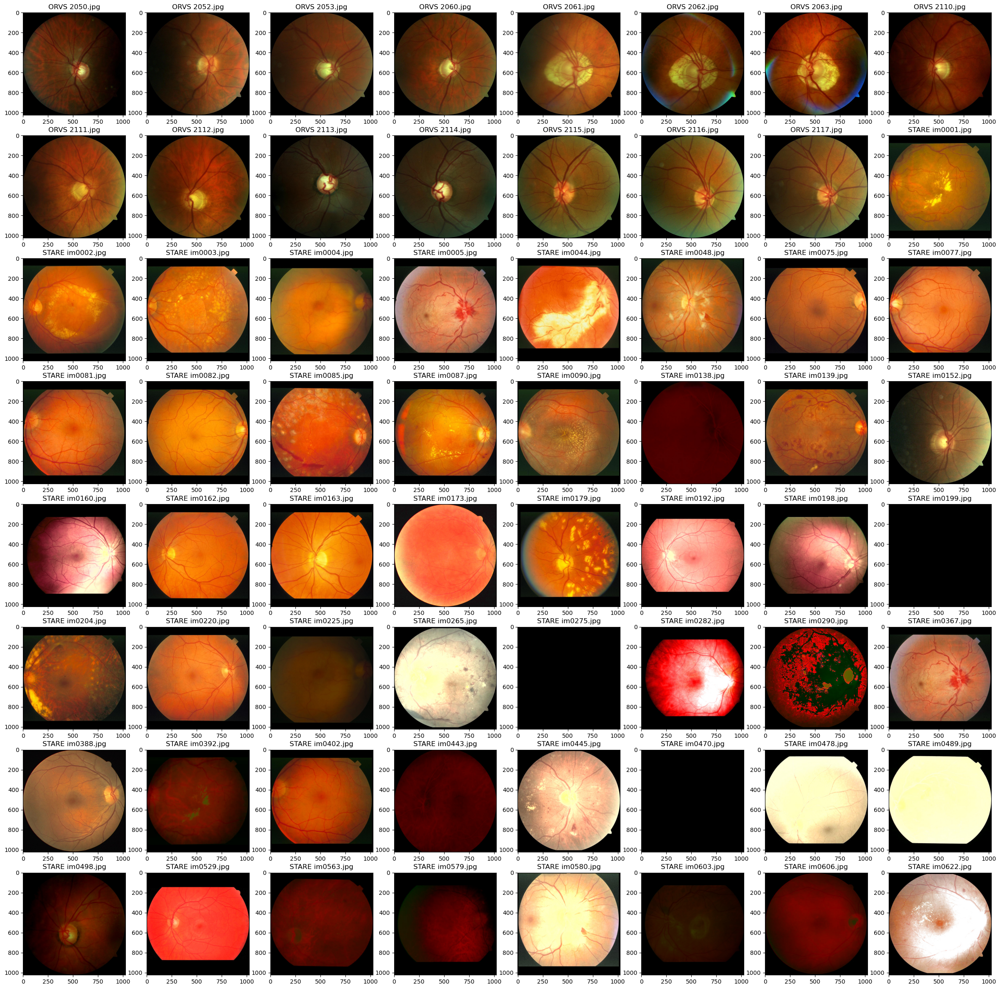

In [6]:
plt_rgb(250)

In [8]:
# img = cv2.cvtColor(cv2.imread('../data/backup/outliers/1697379558.99882.jpg'), cv2.COLOR_BGR2GRAY)
# histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
  
# # show the plotting graph of an image 
# plt.plot(histr) 
# plt.show()

# from scipy.stats import skew 

# histr.std()

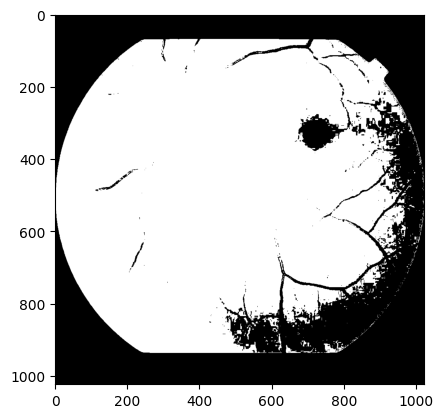

In [4]:
img = cv2.cvtColor(cv2.imread('../data/uncleaned/train/img/AFIO_IM000004.jpg'), cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img,90,100,cv2.THRESH_BINARY)
plt.imshow(thresh1, cmap='gray')

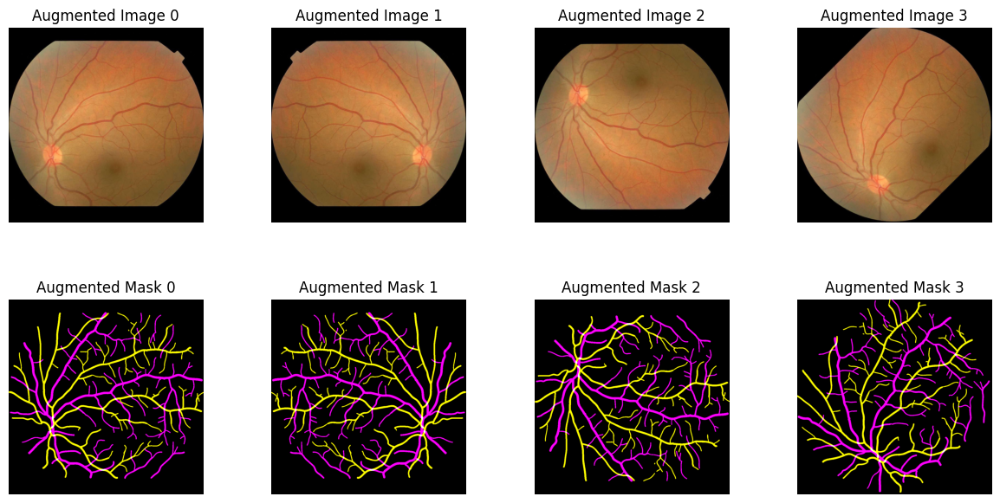

In [8]:
from imgaug import augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

def plot_augments(augmented_images, augmented_masks):
    num_augmentations = len(augmented_images)

    if num_augmentations != len(augmented_masks):
        raise ValueError("The number of augmented images and masks must be the same.")

    num_rows = 2
    num_cols = 4

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 7))
    plt.subplots_adjust(wspace=0.2, hspace=0.4)

    for i in range(num_augmentations):
        row = i // num_cols
        col = i % num_cols

        axes[row, col].imshow(cv2.cvtColor(augmented_images[i], cv2.COLOR_BGR2RGB))
        axes[row, col].set_title(f"Augmented Image {i}")
        axes[row, col].axis('off')

    for i in range(num_augmentations):
        row = (i + num_augmentations) // num_cols
        col = (i + num_augmentations) % num_cols

        # Convert the segmentation mask to RGB for display
        axes[row, col].imshow(augmented_masks[i], cmap='gray')
        axes[row, col].set_title(f"Augmented Mask {i}")
        axes[row, col].axis('off')

    plt.show()

def augment_image(image, rotation_angle=45):
    augmented_images = []
    augmented_images.append(image)

    horizontal_flipped = cv2.flip(image, 1)
    augmented_images.append(horizontal_flipped)
    vertical_flipped = cv2.flip(image, 0)
    augmented_images.append(vertical_flipped)

    height, width = image.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), rotation_angle, 1)
    rotated = cv2.warpAffine(image, rotation_matrix, (width, height))
    augmented_images.append(rotated)

    return augmented_images

mask = cv2.cvtColor(cv2.imread('../data/uncleaned/train/vessel/AFIO_IM000001_vessel.png'), cv2.COLOR_BGR2RGB)
img = cv2.imread('../data/uncleaned/train/img/AFIO_IM000001.jpg')
X = augment_image(image=img)
Y = augment_image(image=mask)
plot_augments(X,Y)

In [ ]:
import os
from PIL import Image
path = '../data/DRIVE/test/1st_manual/'
folder = os.listdir(path)

for i in folder:
    im = Image.open(f'{path}{i}')
    im.save( f'{path}{i}'+'.png','PNG')
    